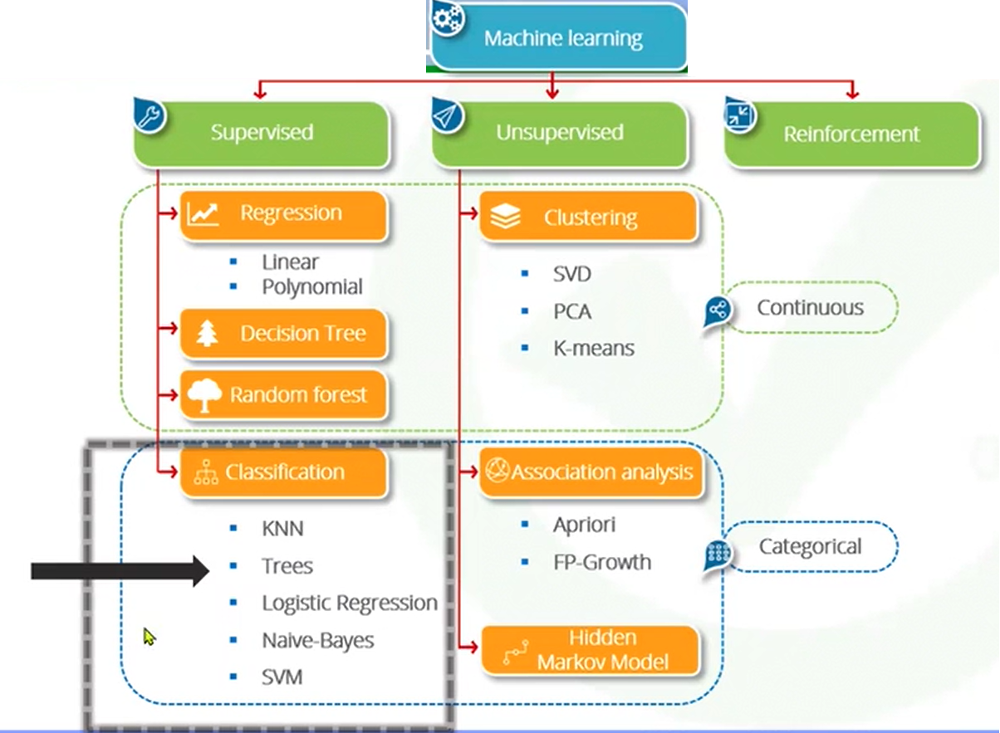

Kök Düğüm (Root Node): Ağacın başlangıç noktasıdır ve tüm örnekleri içerir.

İç Düğüm (Decision Node): Bir özellik/test üzerine bir kararın yapıldığı noktadır.

Yaprak Düğüm (Leaf Node): Ağacın sonunda, kararın verildiği noktadır.

Dallar (Branches): Kararların sonuçlarına göre verileri alt kümelerine bölen yollardır.

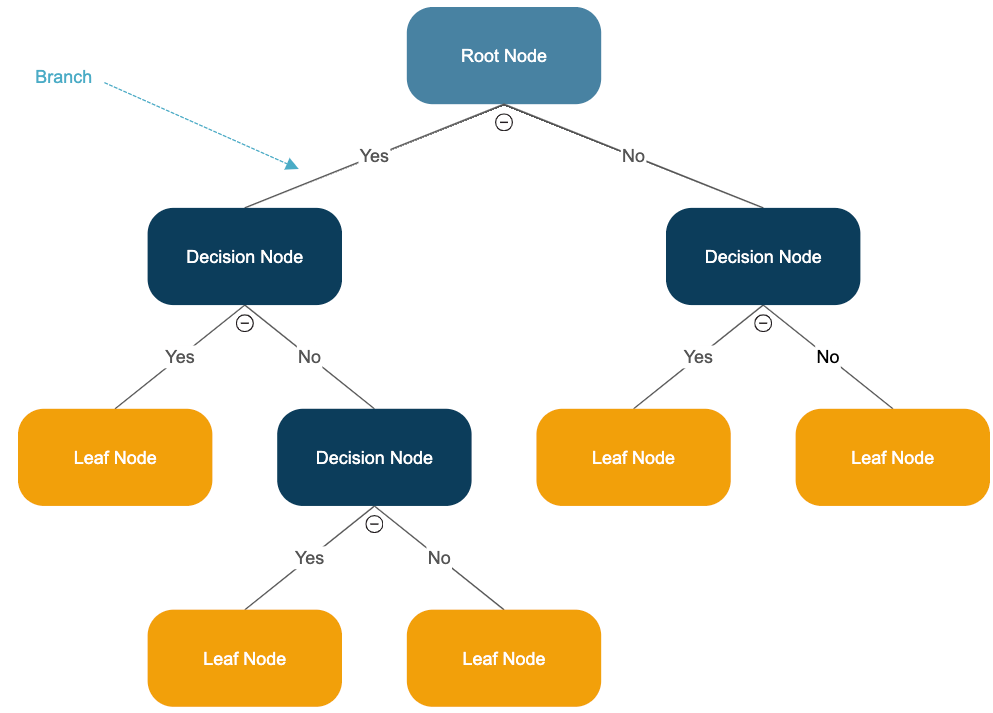

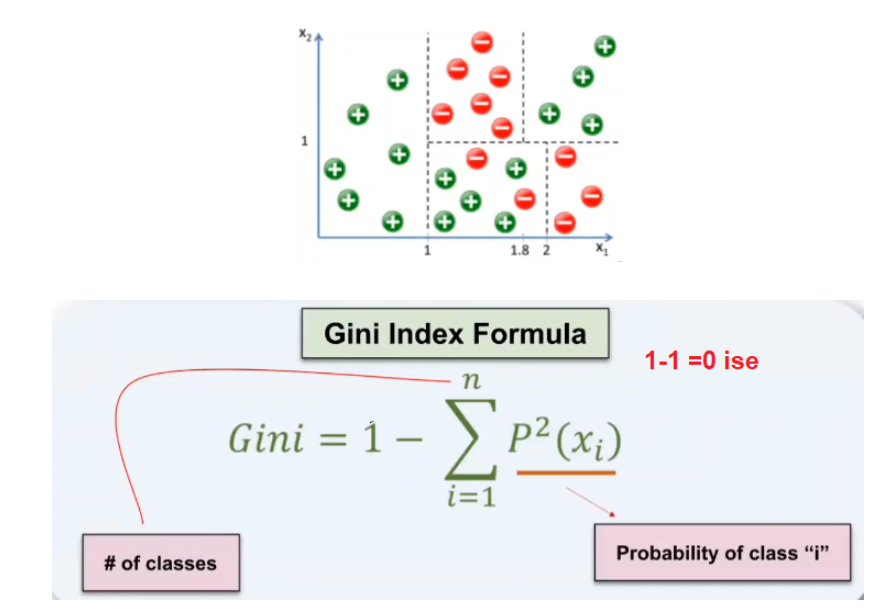

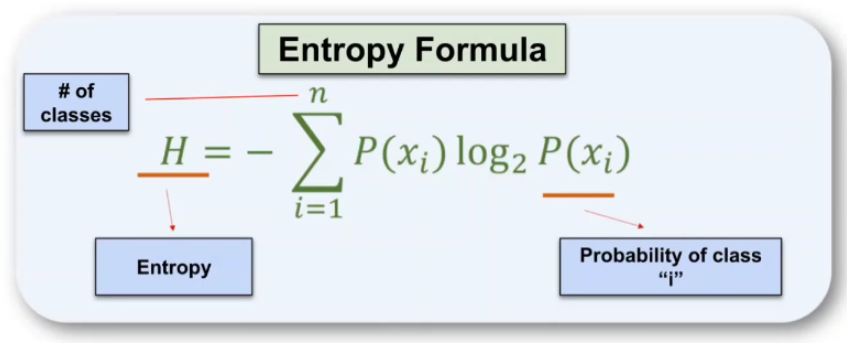

**Bilgi Kazancı (Information Gain)**

Tanım: Bir özelliğin bölünme ölçütü olarak ne kadar iyi çalıştığını belirtir. Özgül bir özelliğin bilgi kazancı, bölünmeden önceki entropi ile bölündükten sonraki entropi arasındaki fark olarak tanımlanır.

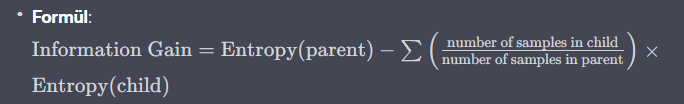

**Örnek:** Eğer bir özellik "hava durumu" olsun ve hedef değişken "dışarıya çıkıp çıkmama" olsun. Hava durumunun "yağmurlu", "güneşli" veya "bulutlu" olabileceğini düşünelim. Bilgi kazancı, hedef değişkenin "yağmurlu", "güneşli" veya "bulutlu" günlerde nasıl dağıldığına bağlı olarak bu özelliğin ne kadar bilgi kazandırdığını belirler.


**Gini Impurity**

**Tanım:** Bir özelliğin ne kadar saflıkta (yani homojen) olduğunu belirten bir ölçümdür. Gini saflığı 0 olduğunda, bir düğümdeki tüm örnekler aynı sınıfa aittir.

yani örneğin x class olma olasılığı 1 olan bir sınıfın gini si 0 çıkar:  

**Formül**

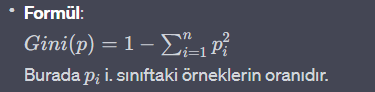

**Entropy**

**Tanım:** Bir setin ne kadar karışık (yani homojen olmayan) olduğunu belirten bir ölçüttür. Entropi, bir sette sadece tek bir sınıf varsa 0 olur.

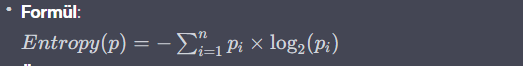

# Data Seti

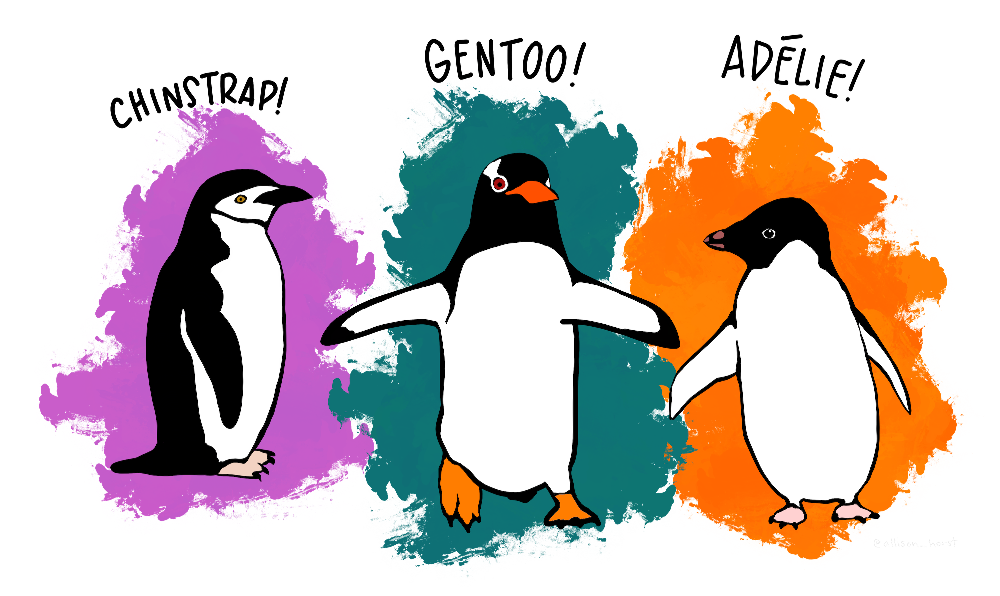

Palmer Archipelago (Antarktika) bölgesindeki penguenler hakkında bilgiler içerir.

Temel özellikleri şunlardır:

**species:** Penguenin türünü gösterir. Örnek değerler: Adelie, Chinstrap, Gentoo.

**island:** Penguenin gözlendiği ada. Örnek değerler: Biscoe, Dream, Torgersen.

**culmen_length_mm:** Penguenin gagasının uzunluğu (milimetre cinsinden).

**culmen_depth_mm:** Penguenin gagasının derinliği (milimetre cinsinden).

**flipper_length_mm:** Penguenin yüzgeç uzunluğu (milimetre cinsinden).

**body_mass_g:** Penguenin vücut ağırlığı (gram cinsinden).

**sex:** Penguenin cinsiyeti.

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

#plt.rcParams["figure.figsize"] = (10,6)

import warnings
warnings.filterwarnings("ignore")
warnings.warn("this will not show")
import plotly.express as px  # 3 d grafik
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import confusion_matrix,classification_report,plot_confusion_matrix
from yellowbrick.classifier import ClassPredictionError
from sklearn.model_selection import cross_val_score, cross_validate
from sklearn.metrics import accuracy_score, f1_score, recall_score, precision_score
from sklearn.metrics import make_scorer
from sklearn.tree import plot_tree


plt.rcParams.update(plt.rcParamsDefault)
import pygwalker as pyg #pip install pygwalker

In [2]:
df = pd.read_csv("penguins_size.csv")
df.head()

,species,island,culmen_length_mm,culmen_depth_mm,flipper_length_mm,body_mass_g,sex
0,Adelie,Torgersen,39.1,18.7,181.0,3750.0,MALE
1,Adelie,Torgersen,39.5,17.4,186.0,3800.0,FEMALE
2,Adelie,Torgersen,40.3,18.0,195.0,3250.0,FEMALE
3,Adelie,Torgersen,NaN,NaN,NaN,NaN,NaN
4,Adelie,Torgersen,36.7,19.3,193.0,3450.0,FEMALE


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 344 entries, 0 to 343
Data columns (total 7 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   species            344 non-null    object 
 1   island             344 non-null    object 
 2   culmen_length_mm   342 non-null    float64
 3   culmen_depth_mm    342 non-null    float64
 4   flipper_length_mm  342 non-null    float64
 5   body_mass_g        342 non-null    float64
 6   sex                334 non-null    object 
dtypes: float64(4), object(3)
memory usage: 18.9+ KB


In [4]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
culmen_length_mm,342.0,43.921930,5.459584,32.1,39.225,44.45,48.5,59.6
culmen_depth_mm,342.0,17.151170,1.974793,13.1,15.600,17.30,18.7,21.5
flipper_length_mm,342.0,200.915205,14.061714,172.0,190.000,197.00,213.0,231.0
body_mass_g,342.0,4201.754386,801.954536,2700.0,3550.000,4050.00,4750.0,6300.0


In [5]:
df.isnull().sum()

species               0
island                0
culmen_length_mm      2
culmen_depth_mm       2
flipper_length_mm     2
body_mass_g           2
sex                  10
dtype: int64

In [6]:
18/344

0.05232558139534884

In [7]:
df = df.dropna()

In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 334 entries, 0 to 343
Data columns (total 7 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   species            334 non-null    object 
 1   island             334 non-null    object 
 2   culmen_length_mm   334 non-null    float64
 3   culmen_depth_mm    334 non-null    float64
 4   flipper_length_mm  334 non-null    float64
 5   body_mass_g        334 non-null    float64
 6   sex                334 non-null    object 
dtypes: float64(4), object(3)
memory usage: 20.9+ KB


In [9]:
df.head()

,species,island,culmen_length_mm,culmen_depth_mm,flipper_length_mm,body_mass_g,sex
0,Adelie,Torgersen,39.1,18.7,181.0,3750.0,MALE
1,Adelie,Torgersen,39.5,17.4,186.0,3800.0,FEMALE
2,Adelie,Torgersen,40.3,18.0,195.0,3250.0,FEMALE
4,Adelie,Torgersen,36.7,19.3,193.0,3450.0,FEMALE
5,Adelie,Torgersen,39.3,20.6,190.0,3650.0,MALE


## Mini EDA and Missing Values

In [10]:
df["sex"].unique()

array(['MALE', 'FEMALE', '.'], dtype=object)

In [11]:
df["island"].unique()

array(['Torgersen', 'Biscoe', 'Dream'], dtype=object)

In [12]:
df["species"].unique()

array(['Adelie', 'Chinstrap', 'Gentoo'], dtype=object)

In [13]:
df[df["sex"]=="."]

,species,island,culmen_length_mm,culmen_depth_mm,flipper_length_mm,body_mass_g,sex
336,Gentoo,Biscoe,44.5,15.7,217.0,4875.0,.


In [14]:
df[df.species=="Gentoo"].groupby("sex").describe().T

sex                           .       FEMALE         MALE
culmen_length_mm  count     1.0    58.000000    61.000000
                  mean     44.5    45.563793    49.473770
                  std       NaN     2.051247     2.720594
                  min      44.5    40.900000    44.400000
                  25%      44.5    43.850000    48.100000
                  50%      44.5    45.500000    49.500000
                  75%      44.5    46.875000    50.500000
                  max      44.5    50.500000    59.600000
culmen_depth_mm   count     1.0    58.000000    61.000000
                  mean     15.7    14.237931    15.718033
                  std       NaN     0.540249     0.741060
                  min      15.7    13.100000    14.100000
                  25%      15.7    13.800000    15.200000
                  50%      15.7    14.250000    15.700000
                  75%      15.7    14.600000    16.100000
                  max      15.7    15.500000    17.300000
flipper_length_mm count     1.0    58.000000    61.000000
                  mean    217.0   212.706897   221.540984
                  std       NaN     3.897856     5.673252
                  min     217.0   203.000000   208.000000
                  25%     217.0   210.000000   218.000000
                  50%     217.0   212.000000   221.000000
                  75%     217.0   215.000000   225.000000
                  max     217.0   222.000000   231.000000
body_mass_g       count     1.0    58.000000    61.000000
                  mean   4875.0  4679.741379  5484.836066
                  std       NaN   281.578294   313.158596
                  min    4875.0  3950.000000  4750.000000
                  25%    4875.0  4462.500000  5300.000000
                  50%    4875.0  4700.000000  5500.000000
                  75%    4875.0  4875.000000  5700.000000
                  max    4875.0  5200.000000  6300.000000

In [15]:
df.loc[336, "sex"] = "MALE"

In [16]:
df.loc[336, "sex"]

'MALE'

## Visualization

In [17]:
df["species"].value_counts()

Adelie       146
Gentoo       120
Chinstrap     68
Name: species, dtype: int64

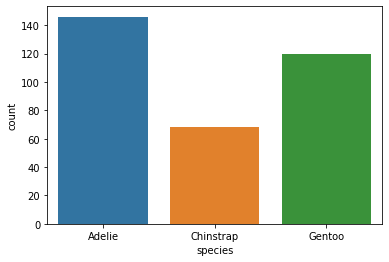

In [18]:
sns.countplot(x = "species", data = df);

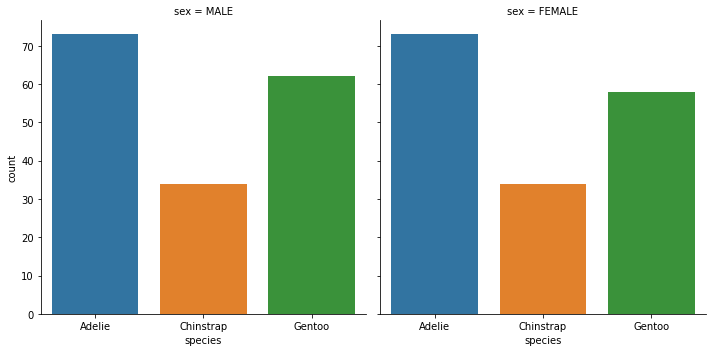

In [19]:
sns.catplot(x = "species", data = df, kind = "count", col = "sex");

<Figure size 864x432 with 0 Axes>

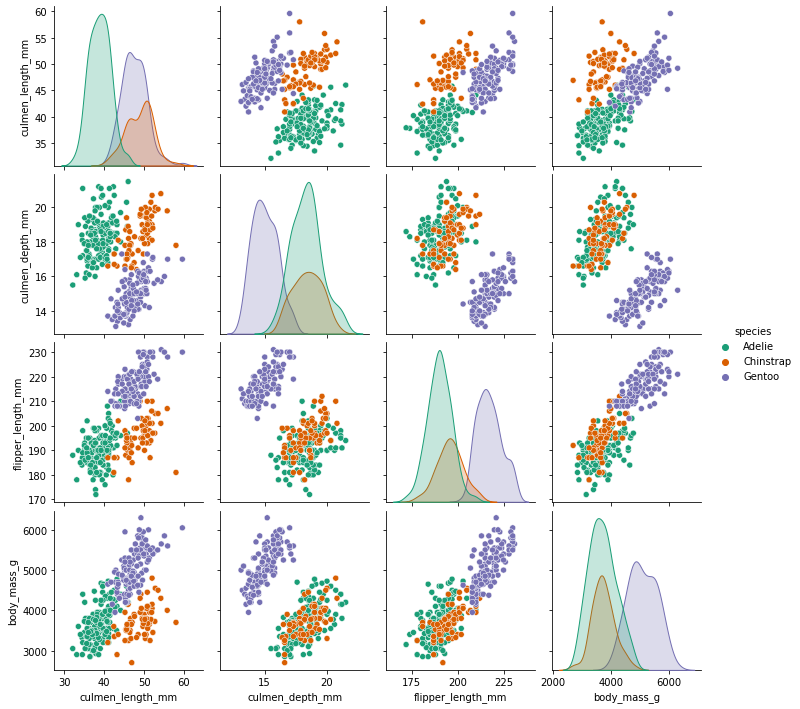

In [20]:
plt.figure(figsize=(12,6))
sns.pairplot(df,hue='species',palette='Dark2')
plt.show()

In [21]:
fig = px.scatter_3d(df, 
                    x='culmen_length_mm',
                    y='flipper_length_mm',
                    z='culmen_depth_mm',
                    color='species')
fig.show();

In [22]:
pyg.walk(df)

In [23]:
df.select_dtypes("number")# numeric veriler

,culmen_length_mm,culmen_depth_mm,flipper_length_mm,body_mass_g
0,39.1,18.7,181.0,3750.0
1,39.5,17.4,186.0,3800.0
2,40.3,18.0,195.0,3250.0
4,36.7,19.3,193.0,3450.0
5,39.3,20.6,190.0,3650.0
...,...,...,...,...
338,47.2,13.7,214.0,4925.0
340,46.8,14.3,215.0,4850.0
341,50.4,15.7,222.0,5750.0
342,45.2,14.8,212.0,5200.0


In [24]:
df.head()

,species,island,culmen_length_mm,culmen_depth_mm,flipper_length_mm,body_mass_g,sex
0,Adelie,Torgersen,39.1,18.7,181.0,3750.0,MALE
1,Adelie,Torgersen,39.5,17.4,186.0,3800.0,FEMALE
2,Adelie,Torgersen,40.3,18.0,195.0,3250.0,FEMALE
4,Adelie,Torgersen,36.7,19.3,193.0,3450.0,FEMALE
5,Adelie,Torgersen,39.3,20.6,190.0,3650.0,MALE


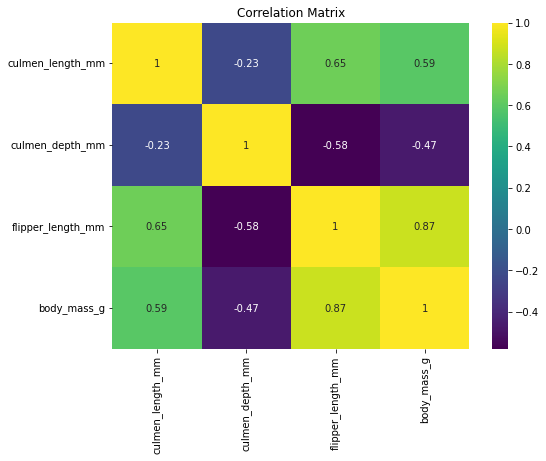

In [25]:
plt.figure(figsize=(8,6))
sns.heatmap(df.select_dtypes("number").corr(),annot=True, cmap='viridis')
plt.title("Correlation Matrix")

plt.show()

Eğerki 0.87 olan değer 0.90 üzerinde olup multicolinearty sorunu olsa idi

Karar ağaçları çoklu doğrusal bağlantı (multicollinearity) problemlerine karşı dayanıklıdır çünkü bu modeller doğrusal olmadığı için featureler arasındaki doğrusal ilişkileri dikkate almazlar. Yani, bir karar ağacı modeli eğitirken multicollinearity'den kaynaklanan bir sorun yaşanmaz.

## Feature Engineering

In [26]:
df.drop("species", axis =1)

,island,culmen_length_mm,culmen_depth_mm,flipper_length_mm,body_mass_g,sex
0,Torgersen,39.1,18.7,181.0,3750.0,MALE
1,Torgersen,39.5,17.4,186.0,3800.0,FEMALE
2,Torgersen,40.3,18.0,195.0,3250.0,FEMALE
4,Torgersen,36.7,19.3,193.0,3450.0,FEMALE
5,Torgersen,39.3,20.6,190.0,3650.0,MALE
...,...,...,...,...,...,...
338,Biscoe,47.2,13.7,214.0,4925.0,FEMALE
340,Biscoe,46.8,14.3,215.0,4850.0,FEMALE
341,Biscoe,50.4,15.7,222.0,5750.0,MALE
342,Biscoe,45.2,14.8,212.0,5200.0,FEMALE


In [27]:
pd.get_dummies(df.drop("species", axis = 1), drop_first=True)

,culmen_length_mm,culmen_depth_mm,flipper_length_mm,body_mass_g,island_Dream,island_Torgersen,sex_MALE
0,39.1,18.7,181.0,3750.0,0,1,1
1,39.5,17.4,186.0,3800.0,0,1,0
2,40.3,18.0,195.0,3250.0,0,1,0
4,36.7,19.3,193.0,3450.0,0,1,0
5,39.3,20.6,190.0,3650.0,0,1,1
...,...,...,...,...,...,...,...
338,47.2,13.7,214.0,4925.0,0,0,0
340,46.8,14.3,215.0,4850.0,0,0,0
341,50.4,15.7,222.0,5750.0,0,0,1
342,45.2,14.8,212.0,5200.0,0,0,0


## Train | Test Split

In [28]:
X = pd.get_dummies(df.drop("species", axis = 1), drop_first=True)
y = df["species"]

In [29]:
DT_model = DecisionTreeClassifier(random_state=101)

In [30]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 101)

In [31]:
DT_model.fit(X_train, y_train)

DecisionTreeClassifier(random_state=101)

In [32]:
y_pred = DT_model.predict(X_test)

In [33]:
def eval_metric(model, X_train, y_train, X_test, y_test):
    y_train_pred = model.predict(X_train)
    y_pred = model.predict(X_test)
    
    print("Test_Set")
    print(confusion_matrix(y_test, y_pred))
    print(classification_report(y_test, y_pred))
    print()
    print("Train_Set")
    print(confusion_matrix(y_train, y_train_pred))
    print(classification_report(y_train, y_train_pred))

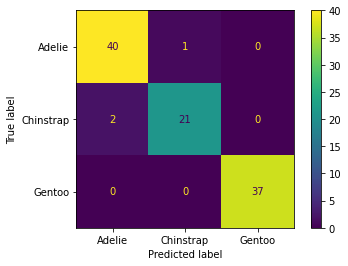

In [34]:
plot_confusion_matrix(DT_model,X_test,y_test)
plt.show()

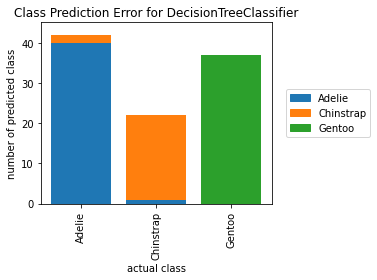

In [35]:
visualizer = ClassPredictionError(DT_model)

# Fit the training data to the visualizer
visualizer.fit(X_train, y_train)

# Evaluate the model on the test data
visualizer.score(X_test, y_test)

# Draw visualization
visualizer.poof();

# yukarıdaki heatmap'in farklı grafiğinin yorumlanması gibi hataların hangi sınıfa ait olduğunu veriyor 

In [36]:
eval_metric(DT_model, X_train, y_train, X_test, y_test)

Test_Set
[[40  1  0]
 [ 2 21  0]
 [ 0  0 37]]
              precision    recall  f1-score   support

      Adelie       0.95      0.98      0.96        41
   Chinstrap       0.95      0.91      0.93        23
      Gentoo       1.00      1.00      1.00        37

    accuracy                           0.97       101
   macro avg       0.97      0.96      0.97       101
weighted avg       0.97      0.97      0.97       101


Train_Set
[[105   0   0]
 [  0  45   0]
 [  0   0  83]]
              precision    recall  f1-score   support

      Adelie       1.00      1.00      1.00       105
   Chinstrap       1.00      1.00      1.00        45
      Gentoo       1.00      1.00      1.00        83

    accuracy                           1.00       233
   macro avg       1.00      1.00      1.00       233
weighted avg       1.00      1.00      1.00       233



micro avg/ Accuracy = Target daki sınıf sayılarım eşitse veya yakınsa (Balanced data)

macro avg  = datamda bir dengesizlik (unbalanced) varsa bakıyordum.

weight avg = eğer datam dengesiz/dengeli ancak ben sayısı yüksek olana göre bakmak istiyorsam kullanıyordum

## Cross Validate

Micro avg ile accuracy aynıdır. aşağıda ispatı mevcut

In [74]:
model = DecisionTreeClassifier(random_state=101)

scores = cross_validate(model, X_train, y_train, scoring = ["accuracy", "precision_micro", "recall_micro", "f1_micro"], cv = 10)
df_scores = pd.DataFrame(scores, index = range(1, 11))
df_scores

,fit_time,score_time,test_accuracy,test_precision_micro,test_recall_micro,test_f1_micro
1,0.022935,0.006982,0.958333,0.958333,0.958333,0.958333
2,0.011963,0.007977,0.958333,0.958333,0.958333,0.958333
3,0.003989,0.003999,0.916667,0.916667,0.916667,0.916667
4,0.004978,0.005984,0.956522,0.956522,0.956522,0.956522
5,0.004990,0.006981,1.000000,1.000000,1.000000,1.000000
6,0.006974,0.004985,1.000000,1.000000,1.000000,1.000000
7,0.002993,0.003990,1.000000,1.000000,1.000000,1.000000
8,0.003998,0.005975,1.000000,1.000000,1.000000,1.000000
9,0.006981,0.004987,0.869565,0.869565,0.869565,0.869565
10,0.001996,0.004985,1.000000,1.000000,1.000000,1.000000


In [38]:
df_scores.mean()[2:]

test_accuracy           0.965942
test_precision_micro    0.965942
test_recall_micro       0.965942
test_f1_micro           0.965942
dtype: float64

## Feature Importances

In [39]:
DT_model.feature_importances_

array([0.32591819, 0.05289252, 0.54282921, 0.        , 0.07836008,
       0.        , 0.        ])

In [40]:
df_f_i = pd.DataFrame(index=X.columns, data = DT_model.feature_importances_, 
                      columns = ["Feature Importance"]).sort_values("Feature Importance")
df_f_i

,Feature Importance
body_mass_g,0.000000
island_Torgersen,0.000000
sex_MALE,0.000000
culmen_depth_mm,0.052893
island_Dream,0.078360
culmen_length_mm,0.325918
flipper_length_mm,0.542829


DT de eğer bir feature çok yüksek bir importance değerine sahipse onu düşürüp birde öyle skor alın sonra bunları karşılaştırın. Sebebi DT güçlü bulduğu featureler üzerinden ilerler diğerlerini kale almaz.

En önemlisi kanat uzunluğu ve gaga uzunluğu en önemli %90 oranında bizim için önemli

işte bu durum bizim modelimizin overfitting e gitmesine neden olabiliyor. DT önemli featurelerle eğer datanın örnke verecek olursak %90 ını ayırt edebiliyorsa diğer featureleri kullanmaz önemsizleştirir. Buda o featurelerden alacağımız insight lardan bizi yoksun bırakır.

hatırlarsanız modelimiz çok compexity olduğunda bizi overfittinge götürüyor demiştim. işte size bir overfitting sebebi daha eğer çok önemli bir feature varsa bu da bizi overfittinge götürebilir.

In [41]:
0.542829+0.325918

0.8687469999999999

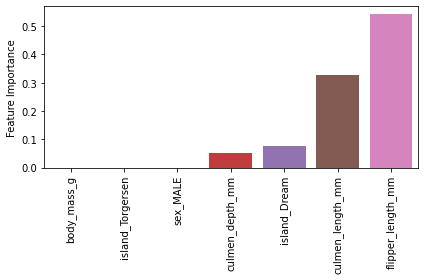

In [42]:
sns.barplot(x = df_f_i.index, y = 'Feature Importance', data = df_f_i)
plt.xticks(rotation = 90)
plt.tight_layout()
plt.show()

## Drop most important feature

In [43]:
X2 = X.drop(columns = ["flipper_length_mm"])

In [44]:
X_train2, X_test2, y_train2, y_test2 = train_test_split(X2, y, test_size=0.3, random_state=101)

In [45]:
DT2_model = DecisionTreeClassifier(random_state=101)

In [46]:
DT2_model.fit(X_train2, y_train2) 

DecisionTreeClassifier(random_state=101)

In [47]:
eval_metric(DT2_model, X_train2, y_train2, X_test2, y_test2)

Test_Set
[[41  0  0]
 [ 1 22  0]
 [ 1  0 36]]
              precision    recall  f1-score   support

      Adelie       0.95      1.00      0.98        41
   Chinstrap       1.00      0.96      0.98        23
      Gentoo       1.00      0.97      0.99        37

    accuracy                           0.98       101
   macro avg       0.98      0.98      0.98       101
weighted avg       0.98      0.98      0.98       101


Train_Set
[[105   0   0]
 [  0  45   0]
 [  0   0  83]]
              precision    recall  f1-score   support

      Adelie       1.00      1.00      1.00       105
   Chinstrap       1.00      1.00      1.00        45
      Gentoo       1.00      1.00      1.00        83

    accuracy                           1.00       233
   macro avg       1.00      1.00      1.00       233
weighted avg       1.00      1.00      1.00       233



In [48]:
df_f_i2 = pd.DataFrame(index=X2.columns, data = DT2_model.feature_importances_, 
                      columns = ["Feature Importance"]).sort_values("Feature Importance")
df_f_i2

,Feature Importance
body_mass_g,0.000000
island_Torgersen,0.000000
sex_MALE,0.010853
culmen_depth_mm,0.113994
island_Dream,0.370391
culmen_length_mm,0.504762


In [49]:
model = DecisionTreeClassifier(random_state=101)

scores = cross_validate(model, X_train2, y_train2, scoring = ["accuracy", "precision_micro", "recall_micro", "f1_micro"], cv = 10)
df_scores = pd.DataFrame(scores, index = range(1, 11))
df_scores

,fit_time,score_time,test_accuracy,test_precision_micro,test_recall_micro,test_f1_micro
1,0.003988,0.006088,1.000000,1.000000,1.000000,1.000000
2,0.003034,0.007942,1.000000,1.000000,1.000000,1.000000
3,0.005762,0.006836,0.958333,0.958333,0.958333,0.958333
4,0.002951,0.006982,1.000000,1.000000,1.000000,1.000000
5,0.004987,0.016837,1.000000,1.000000,1.000000,1.000000
6,0.002992,0.003001,1.000000,1.000000,1.000000,1.000000
7,0.001991,0.002993,1.000000,1.000000,1.000000,1.000000
8,0.006981,0.004987,1.000000,1.000000,1.000000,1.000000
9,0.001994,0.003988,1.000000,1.000000,1.000000,1.000000
10,0.003990,0.010971,0.956522,0.956522,0.956522,0.956522


In [50]:
df_scores.mean()[2:] ## En önemli feature düştükten sonra alınan skorlar çok ilginç daha yüksek.

test_accuracy           0.991486
test_precision_micro    0.991486
test_recall_micro       0.991486
test_f1_micro           0.991486
dtype: float64

## Skorları alttaki gibi class lara yönelik almak için manuel kod

In [51]:
scoring = {'precision-Adelie': make_scorer(precision_score,  average=None, labels=["Adelie"]),
           'recall-Adelie': make_scorer(recall_score, average=None, labels =["Adelie"]),
           'f1-Adelie': make_scorer(f1_score, average=None, labels = ["Adelie"]),
          
          'precision-Chinstrap': make_scorer(precision_score,  average=None, labels=["Chinstrap"]),
          'recall-Chinstrap': make_scorer(recall_score, average=None, labels=["Chinstrap"]),
          'f1-Chinstrap': make_scorer(f1_score, average=None, labels=["Chinstrap"]),
          
          
          'precision-Gentoo': make_scorer(precision_score,  average=None, labels=["Gentoo"]),
          'recall-Gentoo': make_scorer(recall_score, average=None, labels = ["Gentoo"]),
          'f1-Gentoo': make_scorer(f1_score, average=None, labels = ["Gentoo"]),
          
          }

In [52]:
model = DecisionTreeClassifier(max_depth=None, random_state=101)

scores = cross_validate(model, X_train2, y_train2, scoring = scoring, cv = 10)
df_scores = pd.DataFrame(scores, index = range(1, 11))
df_scores.mean()[2:]

test_precision-Adelie       1.000000
test_recall-Adelie          0.980909
test_f1-Adelie              0.989975
test_precision-Chinstrap    0.983333
test_recall-Chinstrap       1.000000
test_f1-Chinstrap           0.990909
test_precision-Gentoo       0.988889
test_recall-Gentoo          1.000000
test_f1-Gentoo              0.994118
dtype: float64

## Visualize the Tree

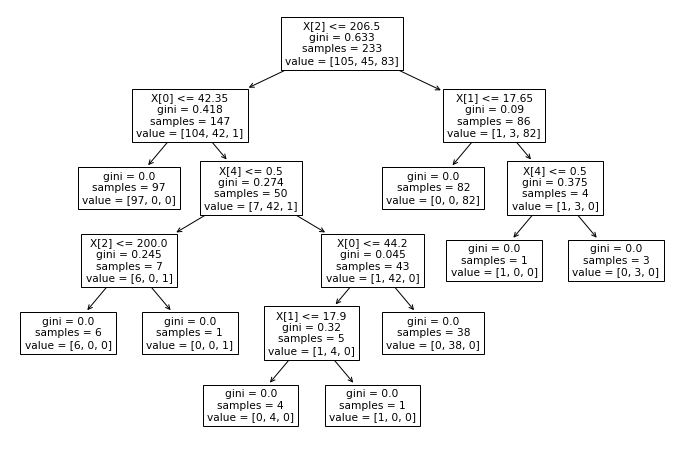

In [53]:
plt.figure(figsize=(12,8))
plot_tree(DT_model);
plt.show()

decision_tree: Görselleştirilmek istenen karar ağacı nesnesi.

max_depth: Ağaçtaki maksimum derinlik. Eğer belirtilmezse tüm ağaç gösterilir.

feature_names: Özelliklerin (features) isimleri. Bu sayede ağaç üzerinde gösterilen özelliklerin daha anlamlı isimleri olabilir.

class_names: Hedef sınıfların (target classes) isimleri. Bu, ağacın sonunda veri noktalarının hangi sınıflara ait olduğunu göstermek için kullanılır.

label: 'all', 'root', 'none' arasında bir değer olabilir. Hangi düğüm etiketlerinin gösterilip gösterilmeyeceğini belirtir.

filled: Boolean değeri. True olduğunda, düğümler sınıflara göre renklendirilir.

impurity: Boolean değeri. True olduğunda, düğümlerde saflık (genellikle Gini saflığı) gösterilir.

node_ids: Boolean değeri. True olduğunda, her düğüm için düğüm ID'leri gösterilir.

proportion: Boolean değeri. True olduğunda, her düğümdeki örneklerin oranı gösterilir.

rounded: Boolean değeri. True olduğunda, düğüm kutularının köşeleri yuvarlanır.

precision: Noktadan sonraki basamak sayısı. Bu, gösterilen ondalıklı değerlerin hassasiyetini ayarlar.

ax: Matplotlib eksen nesnesi. Eğer belirtilmezse mevcut eksen kullanılır veya yeni bir eksen oluşturulur.

fontsize: Yazı tipi boyutu. Düğümlerdeki metnin boyutunu belirtmek için kullanılır.

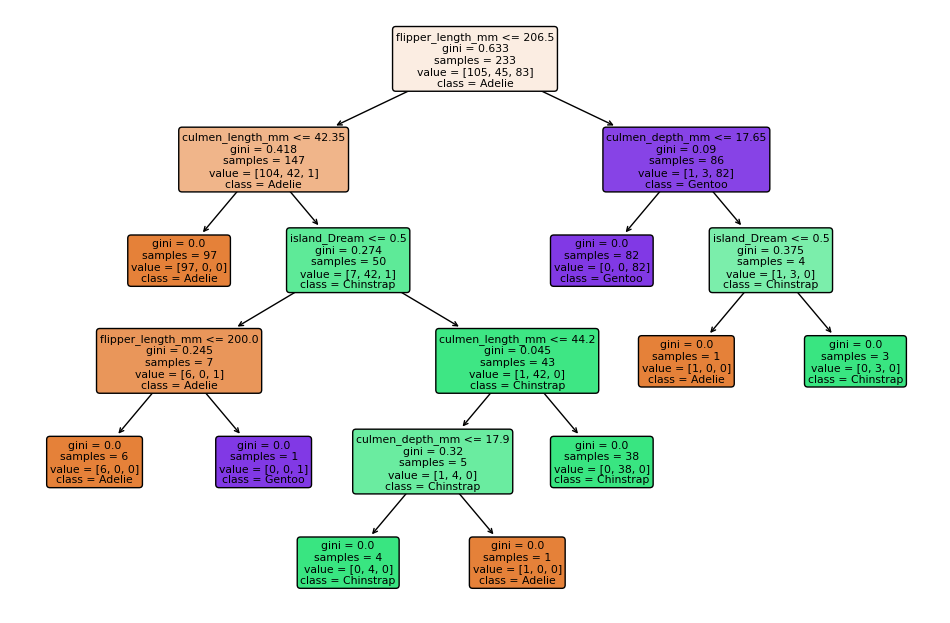

In [54]:
plt.figure(figsize=(12,8),dpi=100)
plot_tree(DT_model, filled=True, feature_names=X.columns, rounded=True, class_names=df.species.unique());
plt.show()

## Understanding Hyperparameters

In [55]:
def report_model(model):
    model_pred = model.predict(X_test)
    model_train_pred = model.predict(X_train)
    print('\n')
    print("Test Set")
    print(confusion_matrix(y_test, model_pred))
    print('\n')
    print(classification_report(y_test,model_pred))
    print('\n')
    print("Train Set")
    print(confusion_matrix(y_train, model_train_pred))
    print('\n')
    print(classification_report(y_train,model_train_pred))
    plt.figure(figsize=(12,8),dpi=100)
    plot_tree(model,filled=True, feature_names=X.columns, class_names=df.species.unique());

criterion: Karar ağacını bölerken kullanılan fonksiyonu belirtir. 'gini' (Gini saflığı) veya 'entropy' (bilgi kazancı) olabilir.

splitter: Her düğümdeki bölünmeyi nasıl seçeceğini belirtir. 'best' en iyi bölünmeyi seçerken, 'random' rastgele bir bölünme seçer.

max_depth: Ağacın maksimum derinliği. Ağacın ne kadar derin olabileceğini sınırlamak için kullanılır.

min_samples_split: Bir düğümü bölmek için gereken minimum örnek sayısı.

min_samples_leaf: Bir yaprağın (düğümün sonu) sahip olması gereken minimum örnek sayısı.

min_weight_fraction_leaf: Bir yaprakta bulunması gereken minimum ağırlıklı örnek oranı.

max_features: Her bölünmede dikkate alınacak maksimum özellik sayısı. 'auto', 'sqrt', 'log2' veya bir tam sayı olabilir.

random_state: Rastlantısallığın kontrol edildiği parametre. Modeli yeniden çalıştırdığınızda aynı sonuçları elde etmek için kullanılır.

max_leaf_nodes: Maksimum yaprak düğümü sayısı. Bu sayıyı sınırlayarak ağacın büyümesini sınırlayabilirsiniz.

min_impurity_decrease: Bir düğümü bölmek için gerekli minimum saflık azalması.

class_weight: Sınıfların ağırlıkları. Dengelemeyi veya özel sınıf ağırlıklandırmasını yapmak için kullanılır.

ccp_alpha: Cost-complexity pruning'in (Maliyet-karmaşıklık budaması) alfası. Ağacın budamasını kontrol etmek için kullanılır. Daha yüksek değerler, daha fazla budamaya neden olur.

## Max Depth

In [88]:
pruned_tree = DecisionTreeClassifier(max_depth=3, random_state=101)
pruned_tree.fit(X_train,y_train)


DecisionTreeClassifier(max_depth=3, random_state=101)



Test Set
[[39  2  0]
 [ 1 22  0]
 [ 0  0 37]]


              precision    recall  f1-score   support

      Adelie       0.97      0.95      0.96        41
   Chinstrap       0.92      0.96      0.94        23
      Gentoo       1.00      1.00      1.00        37

    accuracy                           0.97       101
   macro avg       0.96      0.97      0.97       101
weighted avg       0.97      0.97      0.97       101



Train Set
[[104   1   0]
 [  0  45   0]
 [  1   0  82]]


              precision    recall  f1-score   support

      Adelie       0.99      0.99      0.99       105
   Chinstrap       0.98      1.00      0.99        45
      Gentoo       1.00      0.99      0.99        83

    accuracy                           0.99       233
   macro avg       0.99      0.99      0.99       233
weighted avg       0.99      0.99      0.99       233



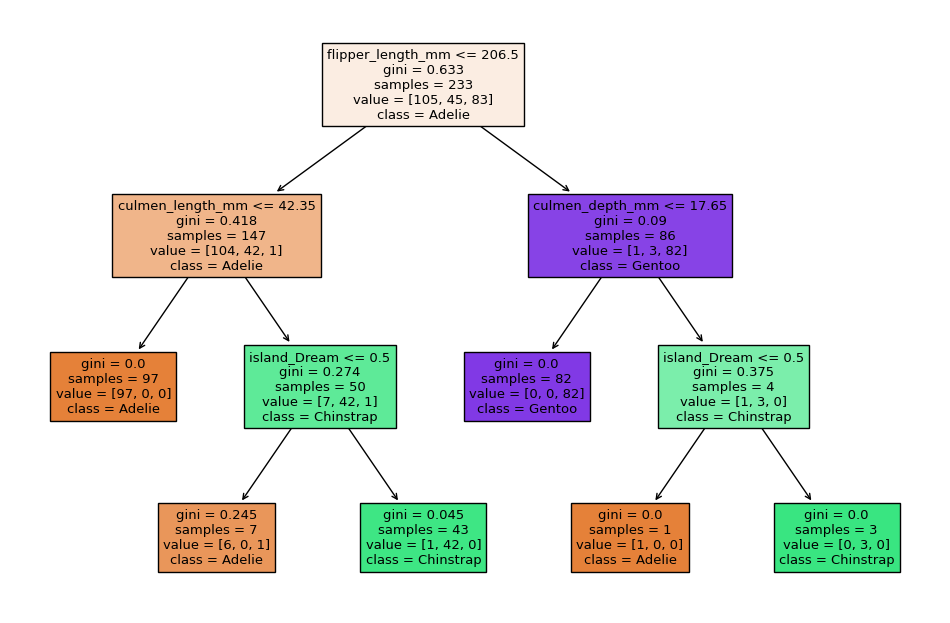

In [89]:
report_model(pruned_tree);

## Max Leaf Nodes

In [102]:
pruned_tree_2 = DecisionTreeClassifier(max_leaf_nodes=5, random_state=101,)
pruned_tree_2.fit(X_train,y_train)

DecisionTreeClassifier(max_leaf_nodes=5, random_state=101)



Test Set
[[39  2  0]
 [ 1 22  0]
 [ 0  0 37]]


              precision    recall  f1-score   support

      Adelie       0.97      0.95      0.96        41
   Chinstrap       0.92      0.96      0.94        23
      Gentoo       1.00      1.00      1.00        37

    accuracy                           0.97       101
   macro avg       0.96      0.97      0.97       101
weighted avg       0.97      0.97      0.97       101



Train Set
[[103   2   0]
 [  0  45   0]
 [  1   0  82]]


              precision    recall  f1-score   support

      Adelie       0.99      0.98      0.99       105
   Chinstrap       0.96      1.00      0.98        45
      Gentoo       1.00      0.99      0.99        83

    accuracy                           0.99       233
   macro avg       0.98      0.99      0.99       233
weighted avg       0.99      0.99      0.99       233



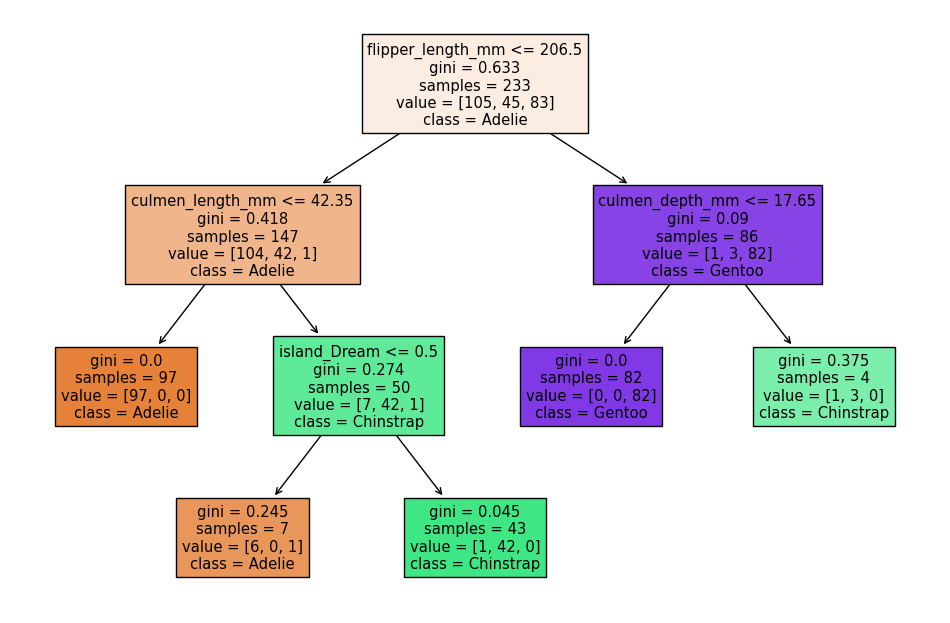

In [103]:
report_model(pruned_tree_2)

## Criterion

In [108]:
entropy_tree = DecisionTreeClassifier(criterion='entropy', random_state=101,)
entropy_tree.fit(X_train,y_train)

DecisionTreeClassifier(criterion='entropy', random_state=101)



Test Set
[[40  1  0]
 [ 2 21  0]
 [ 0  0 37]]


              precision    recall  f1-score   support

      Adelie       0.95      0.98      0.96        41
   Chinstrap       0.95      0.91      0.93        23
      Gentoo       1.00      1.00      1.00        37

    accuracy                           0.97       101
   macro avg       0.97      0.96      0.97       101
weighted avg       0.97      0.97      0.97       101



Train Set
[[105   0   0]
 [  0  45   0]
 [  0   0  83]]


              precision    recall  f1-score   support

      Adelie       1.00      1.00      1.00       105
   Chinstrap       1.00      1.00      1.00        45
      Gentoo       1.00      1.00      1.00        83

    accuracy                           1.00       233
   macro avg       1.00      1.00      1.00       233
weighted avg       1.00      1.00      1.00       233



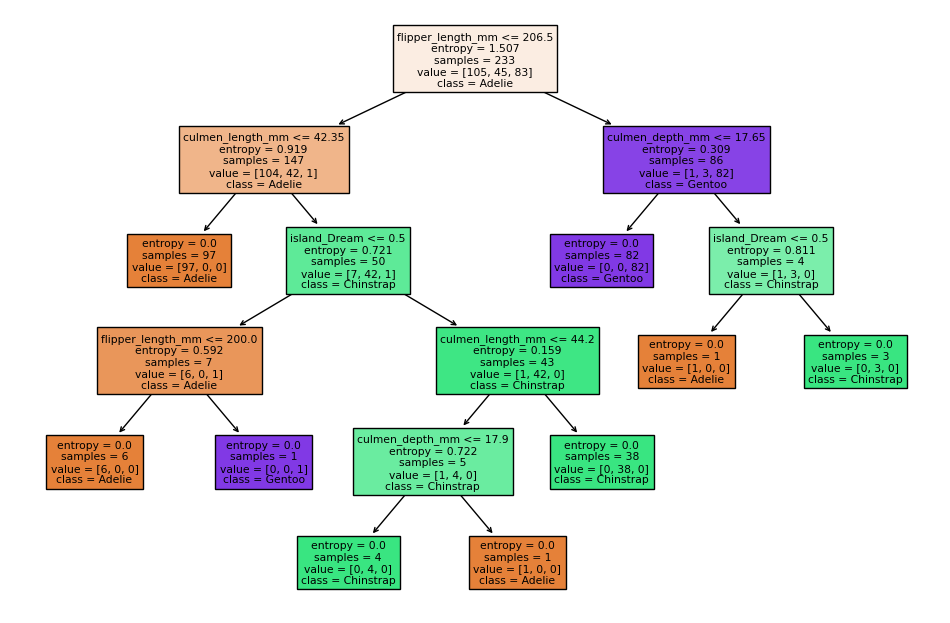

In [109]:
report_model(entropy_tree)

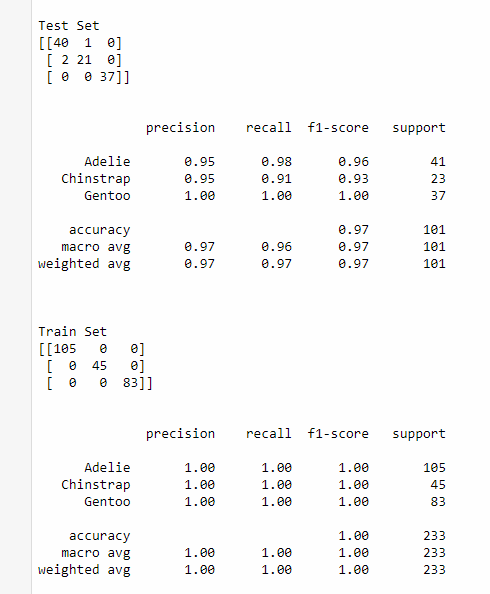

## Min Sample Split

In [115]:
tree = DecisionTreeClassifier(min_samples_split=5)
tree.fit(X_train,y_train)

DecisionTreeClassifier(min_samples_split=5)



Test Set
[[40  1  0]
 [ 1 22  0]
 [ 0  0 37]]


              precision    recall  f1-score   support

      Adelie       0.98      0.98      0.98        41
   Chinstrap       0.96      0.96      0.96        23
      Gentoo       1.00      1.00      1.00        37

    accuracy                           0.98       101
   macro avg       0.98      0.98      0.98       101
weighted avg       0.98      0.98      0.98       101



Train Set
[[104   1   0]
 [  0  45   0]
 [  0   0  83]]


              precision    recall  f1-score   support

      Adelie       1.00      0.99      1.00       105
   Chinstrap       0.98      1.00      0.99        45
      Gentoo       1.00      1.00      1.00        83

    accuracy                           1.00       233
   macro avg       0.99      1.00      0.99       233
weighted avg       1.00      1.00      1.00       233



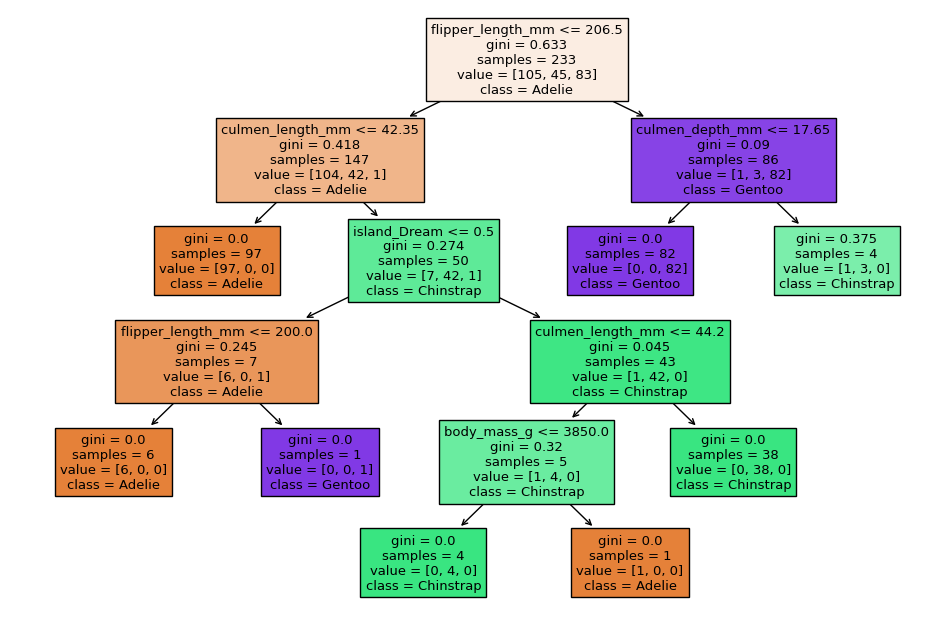

In [116]:
report_model(tree)

## max features, spliter

In [130]:
tree = DecisionTreeClassifier(splitter='best', max_features=2)
tree.fit(X_train,y_train)

DecisionTreeClassifier(max_features=2)



Test Set
[[40  1  0]
 [ 1 22  0]
 [ 0  0 37]]


              precision    recall  f1-score   support

      Adelie       0.98      0.98      0.98        41
   Chinstrap       0.96      0.96      0.96        23
      Gentoo       1.00      1.00      1.00        37

    accuracy                           0.98       101
   macro avg       0.98      0.98      0.98       101
weighted avg       0.98      0.98      0.98       101



Train Set
[[105   0   0]
 [  0  45   0]
 [  0   0  83]]


              precision    recall  f1-score   support

      Adelie       1.00      1.00      1.00       105
   Chinstrap       1.00      1.00      1.00        45
      Gentoo       1.00      1.00      1.00        83

    accuracy                           1.00       233
   macro avg       1.00      1.00      1.00       233
weighted avg       1.00      1.00      1.00       233



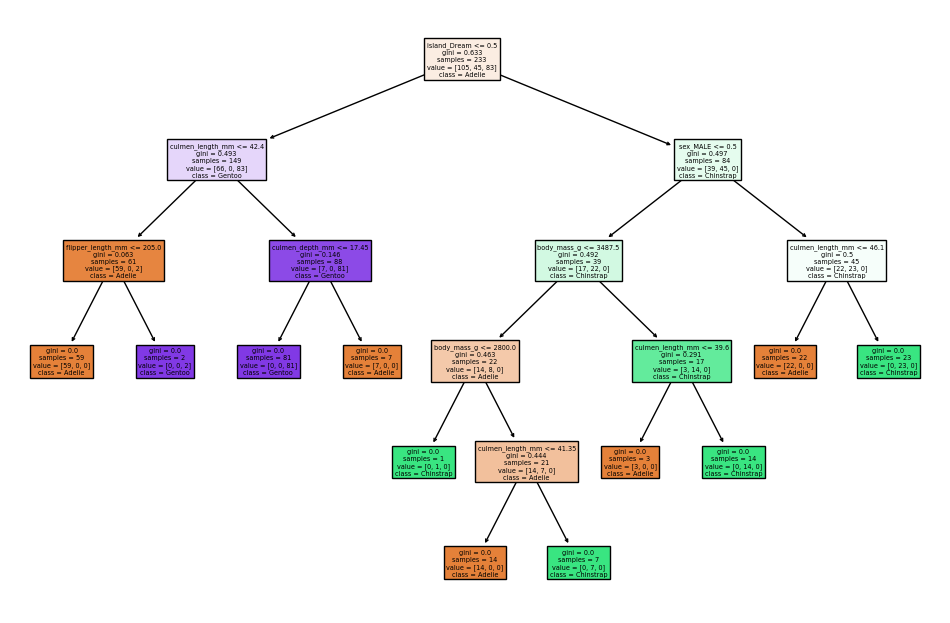

In [131]:
report_model(tree)

## Find Best Parameters

In [67]:
from sklearn.model_selection import GridSearchCV

In [68]:
model = DecisionTreeClassifier(random_state=101)

In [69]:
param_grid = {"splitter":["best", "random"],
              "max_features":[None, "auto", "log2", 2, 3, 4, 5, 6, 7],
              "max_depth": [None, 2, 3, 4, 5],
              "min_samples_leaf": [1, 2, 3, 4, 5, 6, 7],
              "min_samples_split": [2, 3, 5, 6, 7, 8, 9]}

In [70]:
grid_model = GridSearchCV(estimator=model,
                          param_grid=param_grid,
                          scoring='f1_micro',
                          cv=10,
                          n_jobs = -1)

In [71]:
grid_model.fit(X_train2, y_train2)

GridSearchCV(cv=10, estimator=DecisionTreeClassifier(random_state=101),
             n_jobs=-1,
             param_grid={'max_depth': [None, 2, 3, 4, 5],
                         'max_features': [None, 'auto', 'log2', 2, 3, 4, 5, 6,
                                          7],
                         'min_samples_leaf': [1, 2, 3, 4, 5, 6, 7],
                         'min_samples_split': [2, 3, 5, 6, 7, 8, 9],
                         'splitter': ['best', 'random']},
             scoring='f1_micro')

In [72]:
grid_model.best_params_

{'max_depth': None,
 'max_features': None,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'splitter': 'best'}

In [134]:
eval_metric(grid_model, X_train2, y_train2, X_test2, y_test2)

Test_Set
[[41  0  0]
 [ 1 22  0]
 [ 1  0 36]]
              precision    recall  f1-score   support

      Adelie       0.95      1.00      0.98        41
   Chinstrap       1.00      0.96      0.98        23
      Gentoo       1.00      0.97      0.99        37

    accuracy                           0.98       101
   macro avg       0.98      0.98      0.98       101
weighted avg       0.98      0.98      0.98       101


Train_Set
[[105   0   0]
 [  0  45   0]
 [  0   0  83]]
              precision    recall  f1-score   support

      Adelie       1.00      1.00      1.00       105
   Chinstrap       1.00      1.00      1.00        45
      Gentoo       1.00      1.00      1.00        83

    accuracy                           1.00       233
   macro avg       1.00      1.00      1.00       233
weighted avg       1.00      1.00      1.00       233



## The End